In [1]:
import os
os.getcwd()

'/home/jpark/www/cloud-edge-framework/v3/test'

# GPU 확인 

## 1. json파일을 txt 파일로 바꾼다. 
## 2. txt파일의 class를 수정 80개 -> 5개 

#### gpu 확인

In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Jul  3 14:55:57 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 520.61.05    Driver Version: 520.61.05    CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:01:00.0 Off |                  Off |
|  0%   47C    P8    38W / 480W |   9538MiB / 24564MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 134.8 gigabytes of available RAM

You are using a high-RAM runtime!


# 데이터 수정 

#### AI hub data
1) bbox 좌표를 coco -> yolo 형태로 바꾸기 <br>
<strong> COCO  </strong> </br>
[x상단왼쪽, y상단왼쪽, width, height] <br>


<br> 참고 </br>
https://velog.io/@dahara3/2-%EB%8D%B0%EC%9D%B4%ED%84%B0-%EC%88%98%EC%A7%91-%EB%B0%8F-%EC%A0%95%EC%A0%9C <br>
https://m.blog.naver.com/hyunmonn/222188720419 


In [4]:
# 전체 
import json
import pandas as pd

path_to_json = 'D:/traffic_light/aihub/Validation/label_c_validation_1280_720_daylight_1/c_validation_1280_720_daylight_1/'

json_files = [pos_json for pos_json in os.listdir(path_to_json) if pos_json.endswith('.json')]
# [s01000100.json, s01000101.json, ...]

# 여기서 red, yellow는 warning, green은 pass로 경고 알려줄거임
# class 0, 1
## green => 0 : pass
## red, yello => 1 : warning

#jsons_data = pd.DataFrame(columns=['status', 'box_center_x', 'box_center_y', 'box_w', 'box_h'])

# we need both the json and an index number so use enumerate()
for index, js in enumerate(json_files):
    # index: 0 js: s01000100.json
    with open(os.path.join(path_to_json, js)) as json_file:
        json_text = json.load(json_file)

        jsons_data = pd.DataFrame(columns=['status', 'box_center_x', 'box_center_y', 'box_w', 'box_h'])

        img_w = json_text['image']['imsize'][0] # 이미지 사이즈 가로 
        img_h = json_text['image']['imsize'][1] # 이미지 사이즈 세로 

        #  light_count가 있으면 신호등임. 
        #  light_count가 두개 있는 경우도 있고, 없는 경우도 있다. 
        num=0
        for i in range(len(json_text['annotation'])): # 1개의 json파일에 여러 개의 객체 정보가 있으므로 for문 
            if 'light_count' in json_text['annotation'][i]: # 여러 개의 객체 중에 light_count 정보를 포함하고 있는 것만 가려내기
                color_list = json_text['annotation'][i]['attribute']
                #print(color_list)
                if color_list[0]['red'] == 'on': # 'red':'on'이면 red라는 정보만 color에 저장 
                    status = '1'
                elif color_list[0]['yellow'] == 'on': # 'yellow':'on'이면 yellow라는 정보만 color에 저장 
                    status = '1'
                elif color_list[0]['green'] == 'on': # 'greed':'on'이면 green라는 정보만 color에 저장 
                    status = '0'
                box = json_text['annotation'][i]['box'] # 좌표값
                my_x = box[0] #x_min
                my_y = box[1] #y_min
                my_w = box[2] - box[0]
                my_h = box[3] - box[1]
        

                box_center_x= round(float((my_x + my_w / 2.0) / img_w), 6)
                box_center_y = round(float((my_y + my_h / 2.0) / img_h), 6)
                box_w = round(float(my_w / img_w), 6)
                box_h = round(float(my_h / img_h), 6)

             

                
                jsons_data.loc[num] = [status, box_center_x, box_center_y, box_w, box_h]
                num += 1

            else:
                continue 



        # txt 파일로 저장.
        # 빈 txt 파일은 저장 안 함.
        if num != 0:
            jsons_data.to_csv(f'D:/json_to_txt_traffic_light/{js.split(".")[0]}.txt', sep=' ', index=False, header=False)
        
# now that we have the pertinent json data in our DataFrame let's look at it
print(jsons_data)

FileNotFoundError: [Errno 2] No such file or directory: 'D:/traffic_light/aihub/Validation/label_c_validation_1280_720_daylight_1/c_validation_1280_720_daylight_1/'

폴더 : json_to_txt_traffic_light </br>
파일 : 17,657 / 30,000 

### MS COCO

In [25]:
import torch 
torch.cuda.is_available()

device = torch.device('cuda')

device

device(type='cuda')

In [ ]:
#!pip install pycocotools 에러 --> 코랩에서 하기 

In [15]:
# coco class number
car = ['16', '18', '74'] #0
person = ['48'] #1
motorbike = ['43'] #2
bicycle = ['9'] #3

In [131]:
coco_label_path = 'D:/Microsoft_COCO.v2-raw.yolov8/train/labels'
instance = Fix_class(coco_label_path)
print(instance.coco_label_path)
print(instance.make_text_file_list())

D:/Microsoft_COCO.v2-raw.yolov8/train/labels
['000000009465_jpg.rf.3d5a6b94f8c1afdc004f2641cd578912.txt', '000000009466_jpg.rf.5b49bdd7c037ed299dd3b6fd2531c34d.txt', '000000009469_jpg.rf.38d5d254d972459fba2431d6ed2baffe.txt', '000000009474_jpg.rf.fe5b0057cd113427b333ccd60c2d10d5.txt', '000000009478_jpg.rf.1584a7148b62cc3612da3407115b14b7.txt', '000000009479_jpg.rf.d800755cd8fbc0d83a82af66d06410ac.txt', '000000009488_jpg.rf.0565b2c1df070867d9d952ce9fd4bd23.txt', '000000009497_jpg.rf.65cf6406834b6c062cf956cf1f19bd21.txt', '000000009509_jpg.rf.3829e0ec7224811876d44060cfc41c13.txt', '000000009511_jpg.rf.5cc98a5c4723baf1311f9cbe03632092.txt', '000000009514_jpg.rf.2569be5737207d5339e8e6654dbb1ddf.txt', '000000009517_jpg.rf.8d4e179a9f45402946f46942ca0f0beb.txt', '000000009520_jpg.rf.efe405ef45ce0fa24c5b6af2a349312c.txt', '000000009527_jpg.rf.29bb7079088d2f84f4fb3ffb879ed0c0.txt', '000000009539_jpg.rf.4a823f0a1de0c1ccbab77c713124e8bb.txt', '000000009542_jpg.rf.5a72e96c5c0145505a60786e87804a5f.

### mscoco

In [16]:
# ms coco 성공
import os 
import pandas as pd

coco_img_path = 'D:/Microsoft_COCO.v2-raw.yolov8/train/images'
#coco_label_path = 'D:/Microsoft COCO.v2-raw.yolov8/train/labels'
coco_label_path = 'D:/Microsoft_COCO.v2-raw.yolov8/train/labels'
txt_files = [pos_txt for pos_txt in os.listdir(coco_label_path) if pos_txt.endswith('.txt')]




for index, txtx in enumerate(txt_files):
    with open(os.path.join(coco_label_path, txtx), 'r') as txt_file:
        data = pd.DataFrame(columns=['class_obj','x','y','w','h']) # txt 저장할 dataframe 만듦 
        con = [] # 하나의 txt에 들어있는 요소들을 모두 저장해줄 list 선언 

        txt_text = txt_file.read() # txt파일 내용물 전체를 read 
        split_line_list = txt_text.split('\n') # 줄 단위로 자름 

        for i in range(len(split_line_list)): # 객체 몇 개인지 
                con.append(split_line_list[i].split(' ')) # 클래스, x, y, w, h 나누고 list로 저장 

        if len(con[0]) != 1: # txt파일이 공백이 아니면 

            for j in range(len(con)):
                if con[j][0] in car:
                    class_obj =  '2'
                            
                elif con[j][0] in person:
                    class_obj = '3'
                            
                elif con[j][0] in motorbike:
                    class_obj = '4'
                                
                elif con[j][0] in bicycle:
                    class_obj = '5'
                                
                else:
                    class_obj = '6' # 나머지 


                data.loc[j] = [class_obj, str(round(float(con[j][1]),6)), \
                                                    str(round(float(con[j][2]),6)), \
                                                    str(round(float(con[j][3]),6)), \
                                                    str(round(float(con[j][4]),6))]
            data.to_csv(f'D:/Microsoft_COCO.v2-raw.yolov8/mscocolabel/{txtx}',sep=' ', index=False, header=False)
            con = []

In [23]:
## 라벨링이 없는 사진 지우기 # mscoco2017
mscoco_label_path = 'D:/Microsoft_COCO.v2-raw.yolov8/mscocolabel'
mscoco_photo_path = 'D:/Microsoft_COCO.v2-raw.yolov8/images'

from pathlib import Path

label_list = [Path(pos_label).stem for pos_label in os.listdir(mscoco_label_path) if pos_label.endswith('.txt')]
photo_list = [Path(pos_photo).stem for pos_photo in os.listdir(mscoco_photo_path)if pos_photo.endswith('.jpg')]

# do_not_exist_list = []

# for i in photo_list:
#     if i not in label_list:
#         do_not_exist_list.append(i)

# print(do_not_exist_list)

print('삭제 전 파일 개수', len(photo_list))

for photo_name in photo_list:
    if photo_name not in label_list:
        os.remove(f'D:/Microsoft_COCO.v2-raw.yolov8/images/{photo_name}.jpg')

# 삭제 후 파일 개수 확인
after_photo_list  = [Path(pos_photo).stem for pos_photo in os.listdir(mscoco_photo_path)if pos_photo.endswith('.jpg')]
print("삭제 후 사진 개수", len(after_photo_list))


# photo_list_after = [Path(pos_photo_after).stem for pos_photo_after in os.listdir(photo_path) if pos_photo_after.endswith('.jpg') ]
# print('삭제 후 파일 개수', len(photo_list_after))

삭제 전 파일 개수 116408
삭제 후 사진 개수 115406


In [22]:
# MSCOCO결과 --> 라벨링이 안되어있는 파일 지웠다. 
# 라벨링 없는 사진 1002개 
# 전체 사진 개수 116408개 
# 삭제 후 사진 개수 115,406개

1002

In [24]:
## 라벨링이 없는 사진 지우기 # aihub
ai_hub_label_path = 'D:/json_to_txt_traffic_light'
ai_hub_photo_path = 'D:/traffic_light/aihub/Validation/[origin]c_validation_1280_720_daylight_1'

from pathlib import Path

label_list = [Path(pos_label).stem for pos_label in os.listdir(ai_hub_label_path) if pos_label.endswith('.txt')]
photo_list = [Path(pos_photo).stem for pos_photo in os.listdir(ai_hub_photo_path)if pos_photo.endswith('.jpg')]

print('삭제 전 파일 개수', len(photo_list))

for photo_name in photo_list:
    if photo_name not in label_list:
        os.remove(f'D:/traffic_light/aihub/Validation/[origin]c_validation_1280_720_daylight_1/{photo_name}.jpg')

# 삭제 후 파일 개수 확인
after_photo_list  = [Path(pos_photo).stem for pos_photo in os.listdir(ai_hub_photo_path)if pos_photo.endswith('.jpg')]
print("삭제 후 사진 개수", len(after_photo_list))

삭제 전 파일 개수 30000
삭제 후 사진 개수 17657


In [ ]:
# aihub 결과 --> 신호등 라벨이 없는 파일 지웠다. 
# 삭제 전 파일 개수 30000
# 삭제 후 파일 개수 17657

In [ ]:
# 결과
# 파일 합치기 

In [47]:
# 1000장만 가지고 오자 
input_dir_label = 'D:/bowonworld/aihub_mscoco/train/labels_origin'
input_dir_img = 'D:/bowonworld/aihub_mscoco/train/images_origin'
output_dir_label = 'D:/bowonworld/aihub_mscoco/train/labels'
output_dir_img = 'D:/bowonworld/aihub_mscoco/train/images'

# 1000개 나눠서 저장 
import os
import shutil

def split_1000_label(input_dir_label, output_dir_label):
    os.getcwd()
    os.chdir(input_dir_label)
    print(os.getcwd())
    con_label = os.listdir()

    label_1000 = con_label[:1000]
    for label_name in label_1000:
        shutil.copy(os.path.join(input_dir_label+'/'+label_name), os.path.join(output_dir_label+'/'+label_name))


def split_1000_img(input_dir_img, output_dir_img):
    os.chdir(input_dir_img)
    print(os.getcwd())
    con_img = os.listdir()
    img_1000 = con_img[:1000]

    for img_name in img_1000:
        shutil.copy(os.path.join(input_dir_img+'/'+img_name), os.path.join(output_dir_img+'/'+img_name))



D:\bowonworld\aihub_mscoco\train\labels_origin


# yolov8 (train.py)

In [1]:
!pip install ultralytics

     ------------------------------------- 612.6/612.6 kB 12.8 MB/s eta 0:00:00
     -------------------------------------- 172.4/172.4 MB 7.0 MB/s eta 0:00:00
     --------------------------------------- 38.1/38.1 MB 21.1 MB/s eta 0:00:00
     ---------------------------------------- 1.2/1.2 MB 15.2 MB/s eta 0:00:00


In [49]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')
model.train(data='D:/bowonworld/total.yaml', epochs=10, batch=16)
# model.val()

# batch = 16 # 1%당 1.8분 

# D:\bowonworld\aihub_mscoco\train\labels_origin\runs\detect\train2 여기 저장됨 

Ultralytics YOLOv8.0.124  Python-3.8.17 torch-1.8.1+cu101 CUDA:0 (NVIDIA GeForce GTX 1080, 8192MiB)
WARNING  Upgrade to torch>=2.0.0 for deterministic training.
yolo\engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=D:/bowonworld/total.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=Tru

# 자막달기 (caption.py)


image 1/1 D:\car01mp4frame\frame1.jpg: 384x640 7 cars, 5 persons, 68.9ms
Speed: 2.0ms preprocess, 68.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


ultralytics.yolo.engine.results.Results object with attributes:

boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'go', 1: 'stop', 2: 'car', 3: 'person', 4: 'motorbike', 5: 'bicycle', 6: 'nothing'}
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [200, 191, 171],
        [146, 137, 117],
        [ 77,  68,  48]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [198, 189, 169],
        [149, 138, 118],
        [ 78,  69,  49]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [211, 200, 180],
        [159, 145, 126],
        [ 80,  69,  49]],

       ...,

       [[223, 215, 215],
        [223, 215, 215],
        [223, 215, 215],
        ...,
        [226, 217, 213],
        [226, 217, 213],
        [226, 217, 213]],

       [[223, 215, 215],
        [223, 215, 215],
        [22

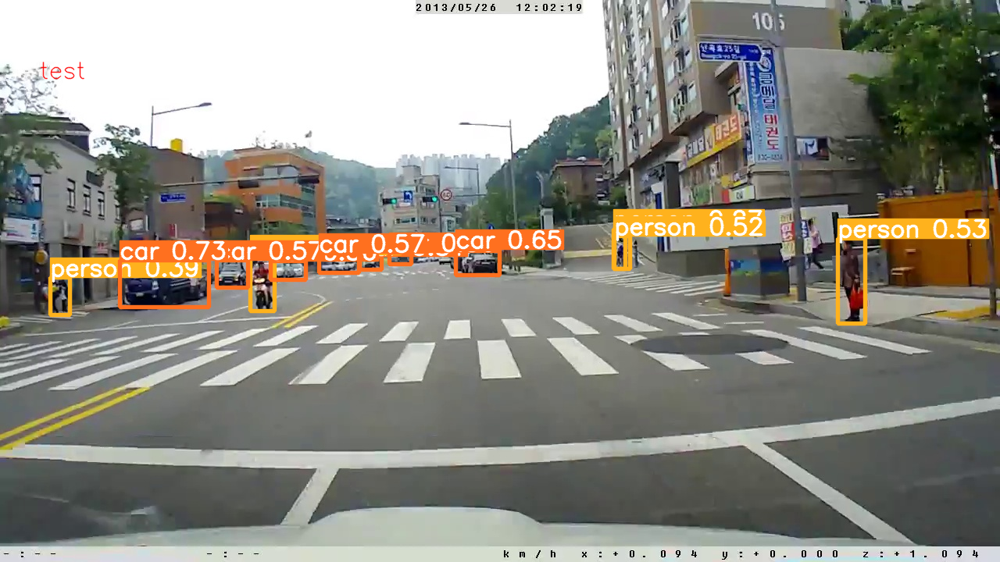

In [61]:
#이미지 
from PIL import Image

test_results = model('D:/car01mp4frame/frame1.jpg')

test_result = test_results[0] # 0~ 1799
print(test_result)

res_plotted = test_result.plot()
img = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
text='test'
font = cv2.FONT_HERSHEY_SIMPLEX # 글자 폰트
fontSize = 1 # 글자 크기
color = (255,0,0) # 글자 색
thickness = 1 # 글자 굵기
res_plotted =   cv2.putText(img, text,(50,100), font, fontSize, color , thickness, cv2.LINE_AA)
display(Image.fromarray(res_plotted))

In [118]:
#https://www.kaggle.com/code/rezasemyari/yolov8#2-Import-Libraries : kaggle
#https://docs.ultralytics.com/reference/yolo/engine/results/#ultralytics.yolo.engine.results.BaseTensor.to : yolo result format
# 이런 식으로 해서 box 크기 큰거?? or probability가장 큰거 !! 만 name하나 들고오는게 어떨까 

box = test_results[0].boxes[0] #test_result[0] 0번째 사진 중에 여러개의 박스가 있는데 그 중  0번째 박스 
#box.cls[0] # 그 0번째 박스의 class #예를 들어 2
test_results[0].names[box.cls[0].item()] # 그럼 2는 2: 'car' 이므로 'car'라는 단어를 뽑아낼 수 있다.

# 근데 왜 result에 probs가 None이지? -- 모델 제대로 학습 안시켜서 그런가 

'car'

In [188]:
test_results[0].boxes

WARNING  'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[1.5972e+02, 3.3492e+02, 2.6856e+02, 3.9296e+02, 7.2279e-01, 2.0000e+00],
        [5.8649e+02, 3.1998e+02, 6.3742e+02, 3.5317e+02, 6.9053e-01, 2.0000e+00],
        [4.0822e+02, 3.2493e+02, 4.5665e+02, 3.5037e+02, 6.0492e-01, 2.0000e+00],
        [2.7756e+02, 3.3642e+02, 3.1735e+02, 3.6845e+02, 5.7936e-01, 2.0000e+00],
        [4.9732e+02, 3.2275e+02, 5.2674e+02, 3.3870e+02, 5.5674e-01, 2.0000e+00],
        [4.9685e+02, 3.2179e+02, 5.1982e+02, 3.3985e+02, 5.5539e-01, 2.0000e+00],
        [1.0569e+03, 3.0789e+02, 1.0950e+03, 4.1298e+02, 5.3652e-01, 3.0000e+00],
        [7.0449e+01, 3.5420e+02, 9.4527e+01, 4.0322e+02, 4.4211e-01, 3.0000e+00],
        [3.2897e+02, 3.2869e+02, 3.5900e+02, 3.9768e+02, 4.1890e-01, 3.0000e+00],
        [3.5308e+02, 3.3679e+02, 3.9093e+02, 3.5805e+02, 4.0043e-01, 2.0000e+00],
        [4.6104e+02, 3.2829e+02, 4.8757e+02, 3.4685e+02, 3.5202e-01, 2.0000e+00],
        [7.8377e+02, 3.0785e

In [205]:
def give_me_max_key(num):
    wh = test_results[num].boxes.xywh[:, 2:4] # wh값만
    print(len(wh))
    print(wh)
    width = {}

    for i in range(len(wh)):
        width[i] = (wh[i][0]*wh[i][1]).item()
        
        # width.append({f'{i}' : (wh[i][0]*wh[i][1]).item()})

        max_width = sorted(width.values(), reverse=True)[0]

    for k, v in width.items():
        if v == max_width:
            max_k = k
            print(k)

            return max_k

In [185]:
print(test_results[0].boxes[max_k], print(max_k))
print(test_results[0].boxes[0])

WARNING  'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING  'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


0
ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[159.7220, 334.9235, 268.5555, 392.9634,   0.7228,   2.0000]], device='cuda:0')
cls: tensor([2.], device='cuda:0')
conf: tensor([0.7228], device='cuda:0')
data: tensor([[159.7220, 334.9235, 268.5555, 392.9634,   0.7228,   2.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (720, 1280)
shape: torch.Size([1, 6])
xywh: tensor([[214.1388, 363.9435, 108.8334,  58.0399]], device='cuda:0')
xywhn: tensor([[0.1673, 0.5055, 0.0850, 0.0806]], device='cuda:0')
xyxy: tensor([[159.7220, 334.9235, 268.5555, 392.9634]], device='cuda:0')
xyxyn: tensor([[0.1248, 0.4652, 0.2098, 0.5458]], device='cuda:0') None
ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[159.7220, 334.9235, 268.5555, 392.9634,   0.7228,   2.0000]], device='cuda:0')
cls: tensor([2.], device='cuda:0')
conf: tensor([0.7228], device='cuda:0')
data: tensor([[159.7220, 334.9235, 268.5555, 392.9634,   0.7228,   2.0000]],

In [210]:
box = test_result.boxes[0]
box

WARNING  'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[8.7348e+02, 9.5590e+01, 1.2800e+03, 4.8965e+02, 9.3758e-01, 2.0000e+00]], device='cuda:0')
cls: tensor([2.], device='cuda:0')
conf: tensor([0.9376], device='cuda:0')
data: tensor([[8.7348e+02, 9.5590e+01, 1.2800e+03, 4.8965e+02, 9.3758e-01, 2.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (720, 1280)
shape: torch.Size([1, 6])
xywh: tensor([[1076.7407,  292.6194,  406.5184,  394.0593]], device='cuda:0')
xywhn: tensor([[0.8412, 0.4064, 0.3176, 0.5473]], device='cuda:0')
xyxy: tensor([[ 873.4816,   95.5898, 1280.0000,  489.6491]], device='cuda:0')
xyxyn: tensor([[0.6824, 0.1328, 1.0000, 0.6801]], device='cuda:0')

In [211]:
#################자막 넣기 중요중요

import cv2

test_results = model('D:/car01.mp4')
fps = 30

output_path = 'D:/mp4test/test_word.mp4'
out = cv2.VideoWriter(output_path,cv2.VideoWriter_fourcc(*'DIVX'), fps, (1280,720))

for i in range(len(test_results)):
    word_key = give_me_max_key(i)
    test_result = test_results[i]
    box = test_result.boxes[word_key]
    word = test_results[i].names[box.cls[0].item()]
    print(test_result)

    res_plotted = test_result.plot()
    img = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
    text=f'warning : {word}'
    font = cv2.FONT_HERSHEY_SIMPLEX # 글자 폰트
    fontSize = 1 # 글자 크기
    color = (0,255,0) # 글자 색
    thickness = 3 # 글자 굵기
    cv2.putText(img, text,(50,100), font, fontSize, color , thickness, cv2.LINE_AA)
    

    out.write(img)

out.release()



    WARNING  stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/1800) D:\car01.mp4: 384x640 8 cars, 4 persons, 103.7ms
video 1/1 (2/1800) D:\car01.mp4: 384x640 7 cars, 5 persons, 71.8ms
video 1/1 (3/1800) D:\car01.mp4: 384x640 8 cars, 5 persons, 40.9ms
video 1/1 (4/1800) D:\car01.mp4: 384x640 8 cars, 4 persons, 25.0ms
video 1/1 (5/1800) D:\car01.mp4: 384x640 8 cars, 4 persons, 28.0ms
video 1/1 (6/1800) D:\car01.mp4: 384x640 8 cars, 6 persons, 29.9ms
video 1/1 (7/1800) D:\car01.mp4: 384x640 8 cars, 5 persons

12
tensor([[108.8334,  58.0399],
        [ 50.9286,  33.1956],
        [ 48.4342,  25.4409],
        [ 39.7894,  32.0321],
        [ 29.4215,  15.9500],
        [ 22.9745,  18.0638],
        [ 38.0991, 105.0902],
        [ 24.0785,  49.0117],
        [ 30.0277,  68.9951],
        [ 37.8477,  21.2576],
        [ 26.5369,  18.5594],
        [ 17.7338,  37.8633]], device='cuda:0')
0
ultralytics.yolo.engine.results.Results object with attributes:

boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'go', 1: 'stop', 2: 'car', 3: 'person', 4: 'motorbike', 5: 'bicycle', 6: 'nothing'}
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 85,  68,  55],
        [ 85,  68,  55],
        [ 85,  68,  55]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 85,  68,  55],
        [ 85,  68,  55],
        [ 85,  68,  55]],

       [[255, 255, 25

In [ ]:
#################자막 넣기 중요중요 # bbox 크기에 따른 word고르기 

import cv2

test_results = model('D:/car01.mp4')
fps = 30

output_path = 'D:/mp4test/test.mp4'
out = cv2.VideoWriter(output_path,cv2.VideoWriter_fourcc(*'DIVX'), fps, (1280,720))

for i in range(len(test_results)):
    test_result = test_results[i]
    give_me_max_key()
    box = test_result.boxes[0]
    word = test_results[i].names[box.cls[0].item()]
    print(test_result)

    res_plotted = test_result.plot()
    img = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
    text=f'warning : {word}'
    font = cv2.FONT_HERSHEY_SIMPLEX # 글자 폰트
    fontSize = 1 # 글자 크기
    color = (0,255,0) # 글자 색
    thickness = 3 # 글자 굵기
    cv2.putText(img, text,(50,100), font, fontSize, color , thickness, cv2.LINE_AA)
    

    out.write(img)

out.release()

In [ ]:
res_plotted

# 나머지

### 비디오 프레임단위로 자르기
<br>https://sj-d.tistory.com/24#:~:text=%EB%B9%84%EB%94%94%EC%98%A4%EB%A5%BC%20%ED%94%84%EB%A0%88%EC%9E%84%20%EB%8B%A8%EC%9C%84%EB%A1%9C%20%EC%9E%90%EB%A5%B4%EB%8A%94%20%EC%BD%94%EB%93%9C%EB%8A%94%20%EB%8B%A4%EC%9D%8C%EA%B3%BC%20%EA%B0%99%EB%8B%A4.%20import,cv2.waitKey%20%2810%29%20%3D%3D%2027%3A%20break%20count%20%2B%3D%201



https://yongyong-e.tistory.com/45 

https://hanryang1125.tistory.com/9

In [1]:
!pip install opencv-python

In [6]:
import os 
print(os.getcwd())
os.chdir('D:/')
print(os.getcwd())

c:\Users\PC2\Documents\GitHub\car
D:\


In [ ]:
!pip install ultraylytics

In [11]:
# 저장된 욜로 모델을 불러와서 객체 탐지 해보쟈 
from ultralytics import YOLO

lp_model_path = 'C:/Users/PC2/bowon/car_plates/object_eraser-main/models' #yolov8-lp.pt

lp_model = YOLO(f"{lp_model_path}/yolov8-lp.pt")
video_result_2 = lp_model.predict("D:/car02.mp4", save_txt=True)


# 54초




    WARNING  stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/3599) D:\car02.mp4: 384x640 (no detections), 27.9ms
video 1/1 (2/3599) D:\car02.mp4: 384x640 (no detections), 60.8ms
video 1/1 (3/3599) D:\car02.mp4: 384x640 (no detections), 29.9ms
video 1/1 (4/3599) D:\car02.mp4: 384x640 (no detections), 35.9ms
video 1/1 (5/3599) D:\car02.mp4: 384x640 (no detections), 31.4ms
video 1/1 (6/3599) D:\car02.mp4: 384x640 (no detections), 34.0ms
video 1/1 (7/3599) D:\car02.mp4: 384x640 (no detections), 34.6ms
video 

In [9]:
video_result

[ultralytics.yolo.engine.results.Results object with attributes:
 
 boxes: ultralytics.yolo.engine.results.Boxes object
 keypoints: None
 keys: ['boxes']
 masks: None
 names: {0: 'license-plate', 1: 'vehicle'}
 orig_img: array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 85,  68,  55],
         [ 85,  68,  55],
         [ 85,  68,  55]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 85,  68,  55],
         [ 85,  68,  55],
         [ 85,  68,  55]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 85,  68,  55],
         [ 85,  68,  55],
         [ 85,  68,  55]],
 
        ...,
 
        [[223, 215, 215],
         [223, 215, 215],
         [223, 215, 215],
         ...,
         [226, 218, 213],
         [226, 218, 213],
         [226, 218, 213]],
 
        [[223, 215, 215],
         [223, 215, 215],
         [223, 215, 2